In [111]:
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import statsmodels.api as sm


import pylab
import csv
import datetime
import math
import re
import time
import random
import os

from pandas.tseries.offsets import *
from operator import *
from statsmodels.tsa.deterministic import Fourier, CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression
from scipy import stats

from sklearn.model_selection import train_test_split

%matplotlib inline

# plt.style.use('ggplot') # Good looking plots

np.set_printoptions(precision=4, threshold=10000, linewidth=100, edgeitems=999, suppress=True)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', 100)
pd.set_option('expand_frame_repr', False)
pd.options.display.precision = 6

start_time = time.time()

Populating the interactive namespace from numpy and matplotlib


In [112]:
# RMSPE метрика
# Thanks to Chenglong Chen for providing this in the forum

def ToWeight(y):
    w = np.zeros(y.shape, dtype=float)
    ind = y != 0
    w[ind] = 1./(y[ind]**2)
    return w

def rmspe(yhat, y):
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean( w * (y - yhat)**2 ))
    return rmspe

def rmspe_xg(yhat, y):
    #y = y.values
    y = y.get_label()
    y = np.exp(y) - 1
    yhat = np.exp(yhat) - 1
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean(w * (y - yhat)**2))
    return "rmspe", rmspe

In [113]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

In [114]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


In [115]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=90,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [116]:
seed = 42

In [117]:
nrows = None

df_train = pd.read_csv('train.csv', 
                       nrows=nrows,
                       parse_dates=['Date'],
                       date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

nrows = nrows

df_submit = pd.read_csv('test.csv', 
                        nrows=nrows,
                        parse_dates=['Date'],
                        date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

In [54]:
df_train

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
...,...,...,...,...,...,...,...,...,...
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1


In [55]:
df_submit

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0
...,...,...,...,...,...,...,...,...
41083,41084,1111,6,2015-08-01,1.0,0,0,0
41084,41085,1112,6,2015-08-01,1.0,0,0,0
41085,41086,1113,6,2015-08-01,1.0,0,0,0
41086,41087,1114,6,2015-08-01,1.0,0,0,0


In [118]:
### признак отличающий тренировочный набор от тестового

df_train['Set'] = 1
df_submit['Set'] = 0

In [119]:
### соединим последовательно train и test

frames = [df_train, df_submit]
df = pd.concat(frames)

In [120]:
features_x = ['Store', 'Date', 'DayOfWeek', 'Open', 'Promo', 'SchoolHoliday', 'StateHoliday']
features_y = ['SalesLog']

In [121]:
### удалим строки где магазин открыт но продаж нет (так как все дни когда продажи равны 0 не учитываются)

df = df.loc[~((df['Open'] == 1) & (df['Sales'] == 0))]

In [122]:
#прологарифмируем Sales и положим в новый столбец SalesLog

df.loc[df['Set'] == 1, 'SalesLog'] = np.log1p(df.loc[df['Set'] == 1]['Sales']) # = np.log(df['Sales'] + 1)

In [123]:
#превртим признак StateHoliday в категориальный

df['StateHoliday'] = df['StateHoliday'].astype('category').cat.codes

In [124]:
#для каждой даты создадим отдельный столбец для дня, недели, месяца, года, дня года и
#заполним пропуски нулями

var_name = 'Date'

df[var_name + 'Day'] = pd.Index(df[var_name]).day
df[var_name + 'Week'] = pd.Index(df[var_name]).week
df[var_name + 'Month'] = pd.Index(df[var_name]).month
df[var_name + 'Year'] = pd.Index(df[var_name]).year
df[var_name + 'DayOfYear'] = pd.Index(df[var_name]).dayofyear


features_x.remove(var_name)
features_x.extend([var_name + 'Day', 
                   var_name + 'Week', 
                   var_name + 'Month', 
                   var_name + 'Year', 
                   var_name + 'DayOfYear'])

In [125]:
#для каждой даты посчитаем эпохальное время - количество наносекунд от начала 1970 года

df['DateInt'] = df['Date'].astype(np.int64)

# Reading store data

In [126]:
df_store = pd.read_csv('store.csv', 
                       nrows=nrows)

In [72]:
df_store

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN


In [127]:
### Конвертируем Storetype и Assortment в категориальные признаки

df_store['StoreType'] = df_store['StoreType'].astype('category').cat.codes
df_store['Assortment'] = df_store['Assortment'].astype('category').cat.codes

In [128]:
### метод который конвертирует столбцы открытия ближайшего конкурента CompetitionOpenSince[Month/Year] в дату

def convertCompetitionOpen(df):
    try:
        date = '{}-{}'.format(int(df['CompetitionOpenSinceYear']), int(df['CompetitionOpenSinceMonth']))
        return pd.to_datetime(date)
    except:
        return np.nan

# создадим столбец CompetitionOpenInt - эпохальное время открытия ближайшего конкурента

df_store['CompetitionOpenInt'] = df_store.apply(lambda df: convertCompetitionOpen(df), axis=1).astype(np.int64)

In [129]:
### метод который конвертирует столбцы когда магазин начал участвовать в Promo2 CompetitionOpenSince[Month/Year] в дату

def convertPromo2(df):
    try:
        date = '{}{}1'.format(int(df['Promo2SinceYear']), int(df['Promo2SinceWeek']))
        return pd.to_datetime(date, format='%Y%W%w')
    except:
        return np.nan

# создадим столбец Promo2SinceFloat - эпохальное время когда магазин начал участвовать в Promo2
    
df_store['Promo2SinceFloat'] = df_store.apply(lambda df: convertPromo2(df), axis=1).astype(np.int64)

In [130]:
#для каждого из 4 интервалов в PromoInterval создадим отдельный столбец

s = df_store['PromoInterval'].str.split(',').apply(pd.Series, 1)
s.columns = ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']
df_store = df_store.join(s)

In [131]:
# метод который возвращает номер месяца по его названию

def monthToNum(date):
    return{
            'Jan' : 1,
            'Feb' : 2,
            'Mar' : 3,
            'Apr' : 4,
            'May' : 5,
            'Jun' : 6,
            'Jul' : 7,
            'Aug' : 8,
            'Sept' : 9, 
            'Oct' : 10,
            'Nov' : 11,
            'Dec' : 12
    }[date]

#названия месяца преобразуем в номер

df_store['PromoInterval0'] = df_store['PromoInterval0'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval1'] = df_store['PromoInterval1'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval2'] = df_store['PromoInterval2'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval3'] = df_store['PromoInterval3'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)

In [132]:
del df_store['PromoInterval']

In [133]:
#добавим полученные признаки в features_x (кроме Promo2SinceFloat, PromoInterval1, PromoInterval2, PromoInterval3)

store_features = ['Store', 'StoreType', 'Assortment', 
                  'CompetitionDistance', 'CompetitionOpenInt',
                  'PromoInterval0']

### Features not helping
# PromoInterval1, PromoInterval2, PromoInterval3

features_x = list(set(features_x + store_features))

df = pd.merge(df, df_store[store_features], how='left', on=['Store'])

In [134]:
### Convert every NAN to -1

for feature in features_x:
    df[feature] = df[feature].fillna(-1)

In [114]:
df.loc[(df['Set'] == 0) & (df['Store'] == 622)]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,Id,SalesLog,DateDay,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0
1017634,622,4,2015-09-17,NaN,NaN,1.0,1,1,0,0,480.0,NaN,17,38,9,2015,260,1442448000000000000,0,2,-1.0,-9223372036854775808,-1.0
1018490,622,3,2015-09-16,NaN,NaN,1.0,1,1,0,0,1336.0,NaN,16,38,9,2015,259,1442361600000000000,0,2,-1.0,-9223372036854775808,-1.0
1019346,622,2,2015-09-15,NaN,NaN,1.0,1,1,0,0,2192.0,NaN,15,38,9,2015,258,1442275200000000000,0,2,-1.0,-9223372036854775808,-1.0
1020202,622,1,2015-09-14,NaN,NaN,1.0,1,1,0,0,3048.0,NaN,14,38,9,2015,257,1442188800000000000,0,2,-1.0,-9223372036854775808,-1.0
1021058,622,7,2015-09-13,NaN,NaN,0.0,0,1,0,0,3904.0,NaN,13,37,9,2015,256,1442102400000000000,0,2,-1.0,-9223372036854775808,-1.0
1021914,622,6,2015-09-12,NaN,NaN,1.0,0,1,0,0,4760.0,NaN,12,37,9,2015,255,1442016000000000000,0,2,-1.0,-9223372036854775808,-1.0
1022770,622,5,2015-09-11,NaN,NaN,1.0,0,1,0,0,5616.0,NaN,11,37,9,2015,254,1441929600000000000,0,2,-1.0,-9223372036854775808,-1.0
1023626,622,4,2015-09-10,NaN,NaN,1.0,0,1,0,0,6472.0,NaN,10,37,9,2015,253,1441843200000000000,0,2,-1.0,-9223372036854775808,-1.0
1024482,622,3,2015-09-09,NaN,NaN,1.0,0,1,0,0,7328.0,NaN,9,37,9,2015,252,1441756800000000000,0,2,-1.0,-9223372036854775808,-1.0
1025338,622,2,2015-09-08,NaN,NaN,1.0,0,1,0,0,8184.0,NaN,8,37,9,2015,251,1441670400000000000,0,2,-1.0,-9223372036854775808,-1.0


In [135]:
#у 622 магазина по какой-то причине некоторые значения Open которые должны быть равны 1 равны -1. Исправим это

df.loc[(df['Set'] == 0) & (df['Store'] == 622), 'Open'] = \
    df.loc[(df['Set'] == 0) & (df['Store'] == 622), 'Open'].replace(-1, 1)


## Вручную проверим и исправим некоторые странные ряды (номера указаны в list_stores_to_check)

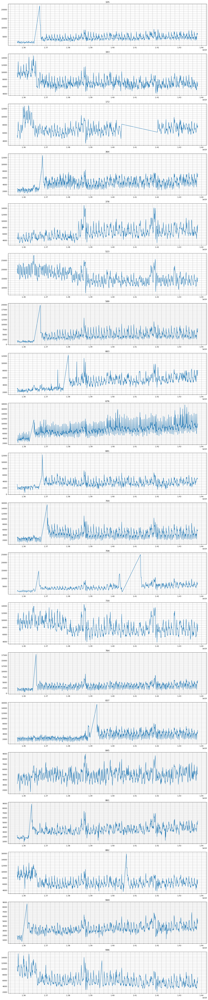

In [115]:
list_stores_to_check = [105,163,172,364,378,523,589,663,676,681,700,708,730,764,837,845,861,882,969,986]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

#только значения когда магазин открыт

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

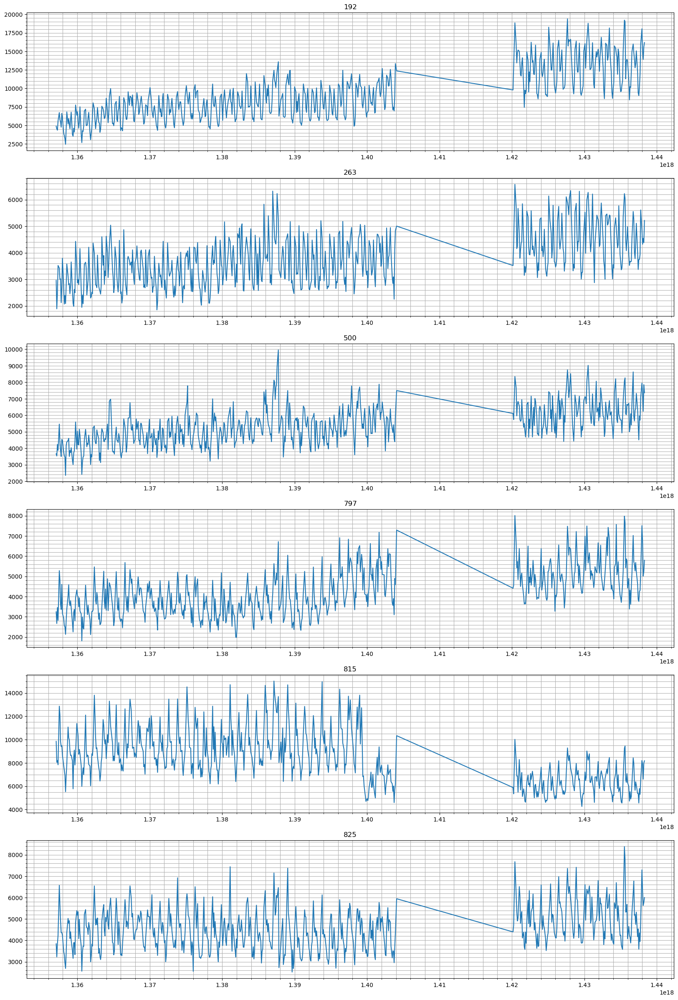

In [116]:
list_stores_to_check = [192,263,500,797,815,825]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

#только значения когда магазин открыт

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Еще несколько рядов но в виде точек (все дни включая когда магазин не работал)

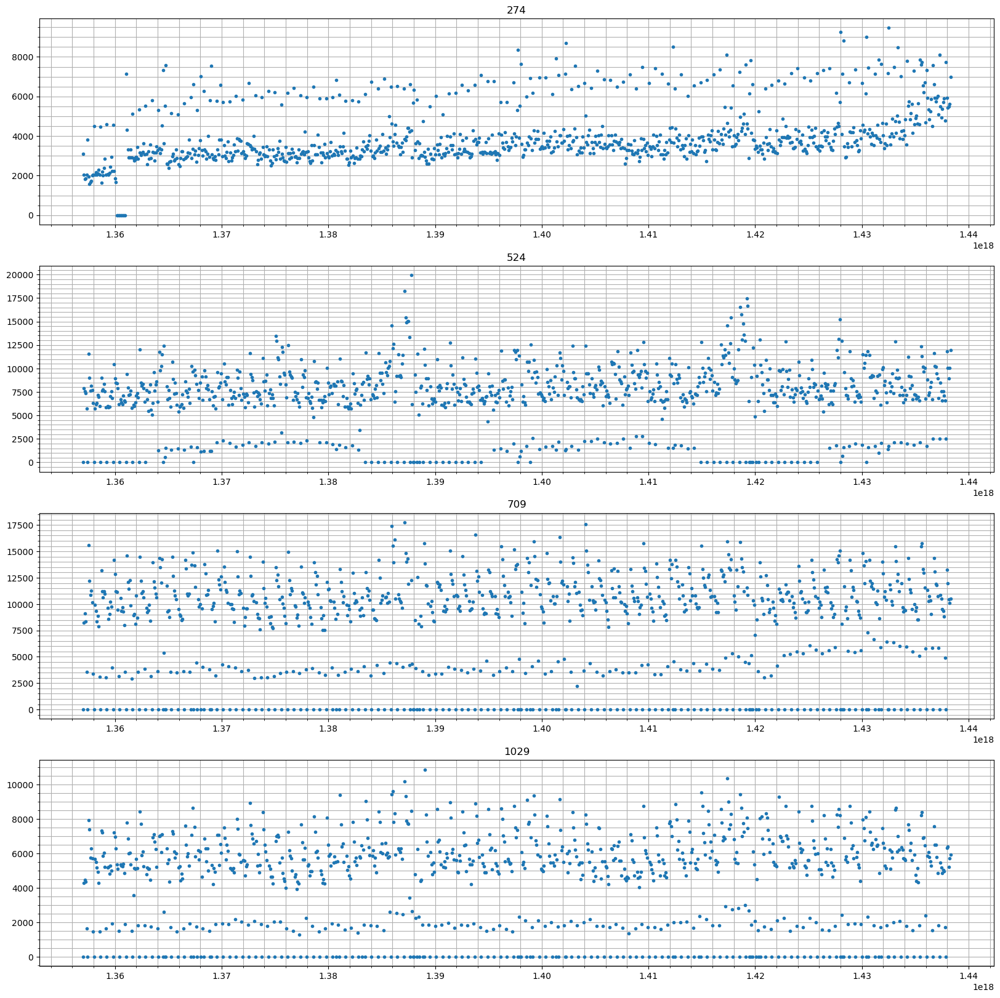

In [117]:
list_stores_to_check = [274,524,709,1029]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '.')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Эти же ряды но непрерывно (только когда магазин работал)

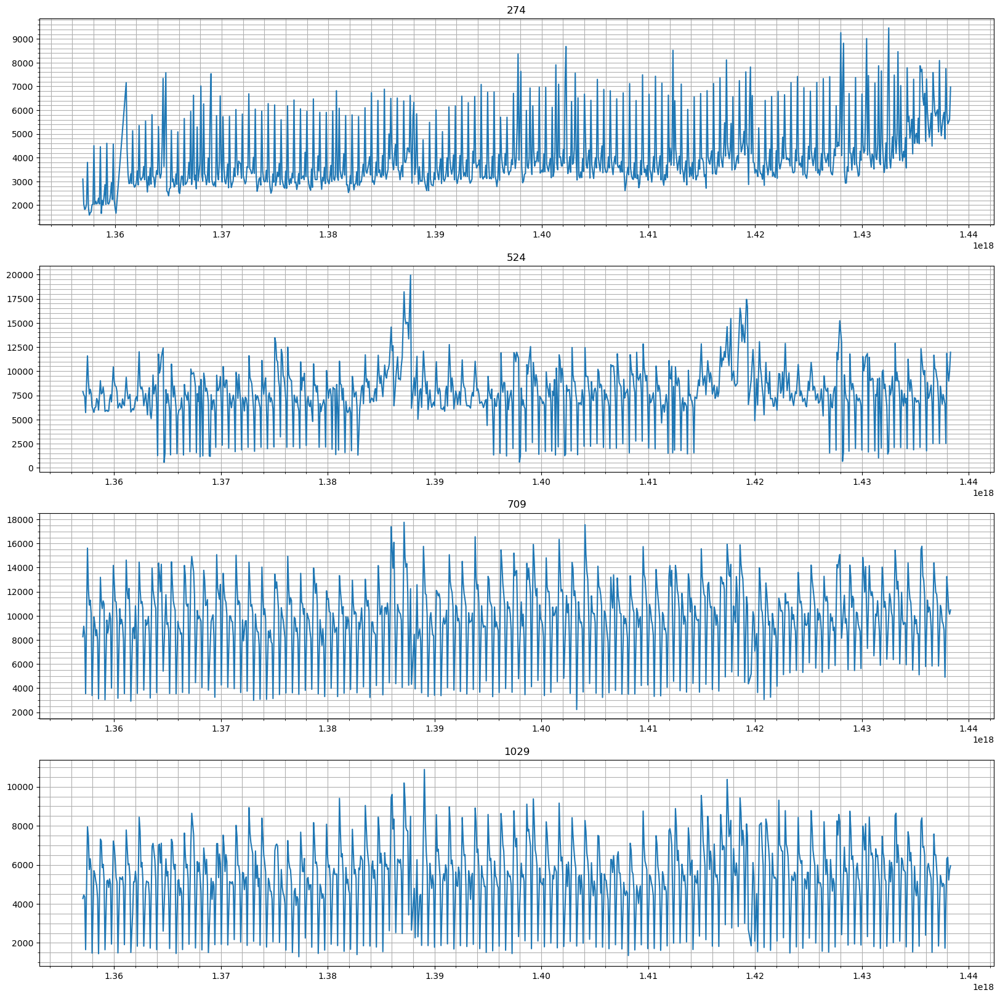

In [118]:
list_stores_to_check = [274,524,709,1029]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Еще несколько рядов (только когда магазин работал)

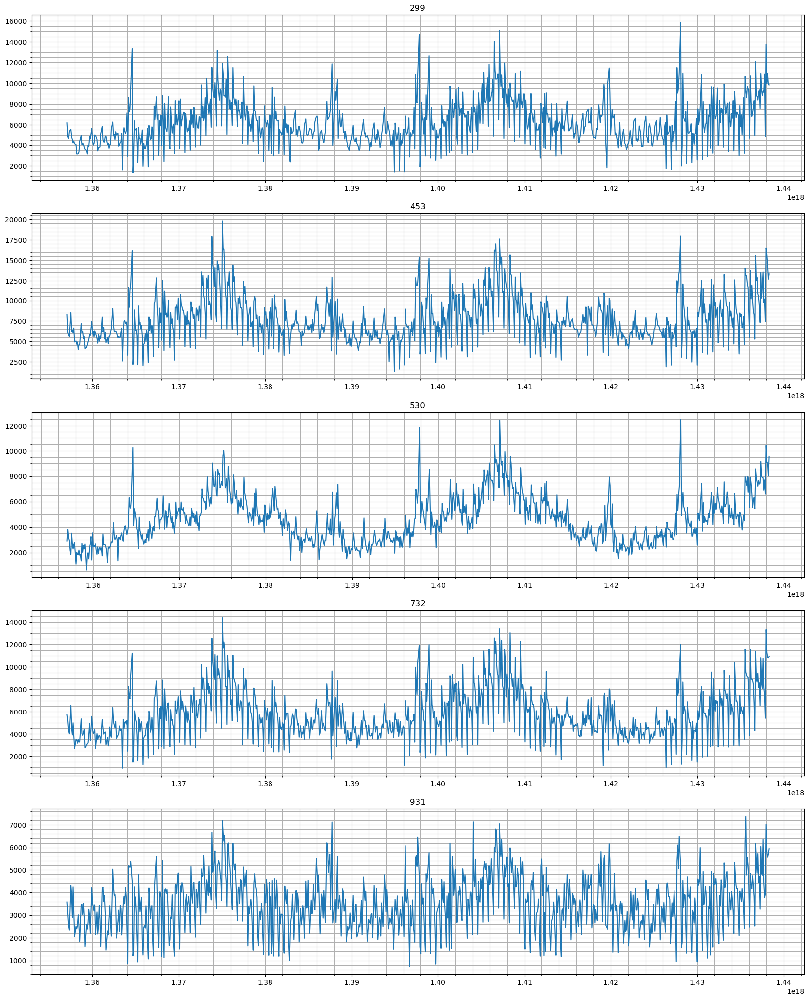

In [119]:
list_stores_to_check = [299,453,530,732,931]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [136]:
#моменты времени для указанных рядов до которых элементы рассматривать не будем

store_dates_to_remove = {   105:1.368e18, 163:1.368e18,
                            172:1.366e18, 364:1.37e18,
                            378:1.39e18, 523:1.39e18,
                            589:1.37e18, 663:1.39e18,
                            676:1.366e18, 681:1.37e18,
                            700:1.373e18, 708:1.368e18,
                            709:1.423e18, 730:1.39e18,
                            764:1.368e18, 837:1.396e18,
                            845:1.368e18, 861:1.368e18,
                            882:1.368e18, 969:1.366e18,
                            986:1.368e18, 192:1.421e18,
                            263:1.421e18, 500:1.421e18,
                            797:1.421e18, 815:1.421e18,
                            825:1.421e18}

# создадим столбец Delete с пометкой на удаление значений ряда с датой меньшей указанной

for key, value in store_dates_to_remove.items():
    df.loc[(df['Store'] == key) & (df['DateInt'] < value), 'Delete'] = True

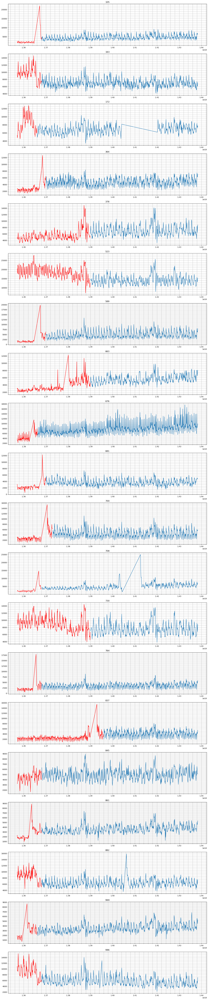

In [121]:
#посмотрим на указанные ряды, удаленную часть выделим красным

list_stores_to_check = [105,163,172,364,378,523,589,663,676,681,700,708,730,764,837,845,861,882,969,986]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] == True)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] == True)]['Sales']
    
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] != True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] != True)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, 'r-')
    plt.plot(X2['DateInt'], y2, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [137]:
### удалим аномальные данные

df = df.loc[df['Delete'] != True]

## Удалим выбросы с отклонением >= 3

In [138]:
#метод считает для каждой точки модифицированный z-score и возвращает true если элемент - выброс

def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:,None]
    
    median = np.median(points, axis=0)
    
    med_abs_deviation = np.median(np.absolute(points - median))

    modified_z_score = 0.6745 * (points - median) / med_abs_deviation

    return modified_z_score > thresh

In [139]:
#для каждого ряда пометим наблюдения выбросы

for i in df['Store'].unique():
    df.loc[(df['Set'] == 1) & (df['Store'] == i) & (df['Open'] == 1), 'Outlier'] = \
        mad_based_outlier(df.loc[(df['Set'] == 1) & (df['Store'] == i) & (df['Open'] == 1)]['Sales'], 3)

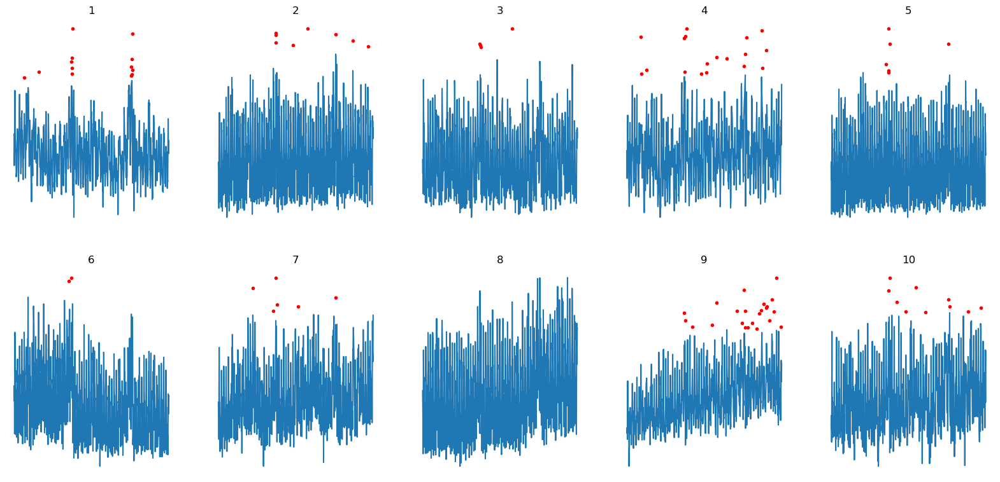

In [125]:
#посмотрим на выбросы первых 10 рядов (магазинов)

no_stores_to_check = 10

plt.rcParams["figure.figsize"] = [20,no_stores_to_check*5]

for i in range(1,no_stores_to_check+1):
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]['Sales']

    # Outliers
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(10,5,i)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(i)
    plt.axis('off')


## Разделим данные в обучении и тест для заполнения выбросов

In [140]:
#поделим данные без выбросов на обучение и тест 

X_train, X_test, y_train, y_test = train_test_split(df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == False)][features_x],
                                                    df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == False)][features_y],
                                                    test_size=0.1, random_state=seed)

In [141]:
#Есть разные api для обучения xgboost, будем использовать тот, где обучающие данные нужно обернуть в DMatrix

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

In [142]:
num_round = 4000
evallist = [(dtrain, 'train'), (dtest, 'test')]

In [143]:
param = {'bst:max_depth':12,
         'bst:eta':0.01,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1,
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки дерева
# colsample_bytree – доля подмножества колонок для обучения дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# обучим модель
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - тренировочный набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - тестовый набор


bst = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)

[16:58:43] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[16:58:43] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78742	train-rmspe:0.99682	test-rmse:5.78692	test-rmspe:0.99682
[250]	train-rmse:0.11973	train-rmspe:0.18864	test-rmse:0.12136	test-rmspe:0.13391
[500]	train-rmse:0.10175	train-rmspe:0.16792	test-rmse:0.10476	test-rmspe:0.11611
[750]	train-rmse:0.09386	train-rmspe:0.13338	test-rmse:0.09818	test-rmspe:0.10919
[1000]	train-rmse:0.08952	train-rmspe:0.11393	test-rmse:0.09498	test-rmspe:0.10588
[1250]	train-rmse:0.08638	train-rmspe:0.10780	test-rmse:0.09298	test-rmspe:0.10382
[1500]	train-rmse:0.08397	train-rmspe:0.09564	test-rm

In [144]:
# выбросы

dpred = xgb.DMatrix(df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True)][features_x])

In [145]:
#сделаем предсказания на выбросах

ypred_bst = bst.predict(dpred)

In [146]:
#добавим предсказания на выбросах в данные

df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True), 'SalesLog'] = ypred_bst
df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True), 'Sales'] = np.exp(ypred_bst) - 1

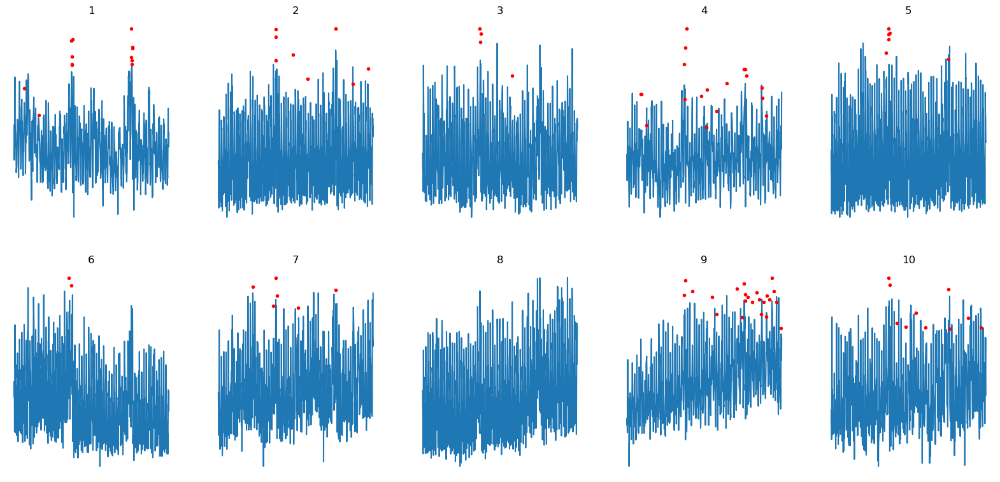

In [133]:
### посмотрим на то какими стали выбросы первых 10 рядов (магазинов)
### видно что точки стали ниже чем раньше

no_stores_to_check = 10

plt.rcParams["figure.figsize"] = [20,no_stores_to_check*5]

for i in range(1,no_stores_to_check+1):
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]['Sales']

    # Outliers
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(10,5,i)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(i)
    plt.axis('off')

## Генерация некоторых дополнительных данных о магазинах из продаж

In [147]:
### Для каждого магазина посчитаем: среднее число продаж за день, среднее число посетителей за день, 
### среднее число продаж на 1 посетителя за день

store_data_sales = df.groupby([df['Store']])['Sales'].sum()
store_data_customers = df.groupby([df['Store']])['Customers'].sum()
store_data_open = df.groupby([df['Store']])['Open'].count()

store_data_sales_per_day = store_data_sales / store_data_open
store_data_customers_per_day = store_data_customers / store_data_open
store_data_sales_per_customer_per_day = store_data_sales_per_day / store_data_customers_per_day

In [148]:
### добавим как признаки

df_store = pd.merge(df_store, store_data_sales_per_day.reset_index(name='SalesPerDay'), how='left', on=['Store'])
df_store = pd.merge(df_store, store_data_customers_per_day.reset_index(name='CustomersPerDay'), how='left', on=['Store'])
df_store = pd.merge(df_store, store_data_sales_per_customer_per_day.reset_index(name='SalesPerCustomersPerDay'), how='left', on=['Store'])

In [149]:
#обновим признаки

store_features = ['Store', 'SalesPerDay', 'CustomersPerDay', 'SalesPerCustomersPerDay']

features_x = list(set(features_x + store_features))

In [150]:
df = pd.merge(df, df_store[store_features], how='left', on=['Store'])

In [151]:
#следующие новые признаки не используются

df['DateDayNext'] = df.apply(lambda row : (row['Date'] + pd.Timedelta(days=1)).day, axis=1)

df['DateMonthOfNextDay'] = df.apply(lambda row : (row['Date'] + pd.Timedelta(days=1)).month, axis=1)

df['DateDayOfWeekNext'] = df.apply(lambda row : row['DayOfWeek'] + 1 if row['DayOfWeek'] + 1 <= 7 else 1, axis=1)

df['DateMonthNext'] = df.apply(lambda row : row['Date'].month + 1 if row['Date'].month + 1 <= 12 else 1, axis=1)

In [152]:
# определим короткие ряды

d = df[df['Set'] == 1].groupby('Store').count()
d[d['Sales'] < 500]

,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,Id,SalesLog,DateDay,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0,Delete,Outlier,SalesPerDay,CustomersPerDay,SalesPerCustomersPerDay,DateDayNext,DateMonthOfNextDay,DateDayOfWeekNext,DateMonthNext
Store,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
192,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
263,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
500,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
709,178,178,178,178,178,178,178,178,178,0,178,178,178,178,178,178,178,178,178,178,178,178,0,148,178,178,178,178,178,178,178
797,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
815,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
825,201,201,201,201,201,201,201,201,201,0,201,201,201,201,201,201,201,201,201,201,201,201,0,167,201,201,201,201,201,201,201
837,490,490,490,490,490,490,490,490,490,0,490,490,490,490,490,490,490,490,490,490,490,490,0,404,490,490,490,490,490,490,490


In [ ]:
#ДЛЯ СРАВНЕНИЯ

X_train, X_test, y_train, y_test = train_test_split(df.loc[(df['Set'] == 1) & (df['Open'] == 1)][features_x],
                                                    df.loc[(df['Set'] == 1) & (df['Open'] == 1)][features_y],
                                                    test_size=0.1, random_state=42)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

num_round = 4000
evallist = [(dtrain, 'train'), (dtest, 'test')]

param = {'bst:max_depth':12,
         'bst:eta':0.0095,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1, 
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

#plst = param.items()

bstSet1 = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)

In [153]:
#поделим данные на обучение и тест (уже с выбросами)          # [192, 263, 500, 797, 815, 825]
#ВАЖНО: попробовать поменять random_state если метрика не улучшается

X_train, X_test, y_train, y_test = train_test_split(df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (~df['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837]))][features_x],
                                                    df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (~df['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837]))][features_y],
                                                    test_size=0.1, random_state=42)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

num_round = 4000
evallist = [(dtrain, 'train'), (dtest, 'test')]

param = {'bst:max_depth':12,
         'bst:eta':0.0095,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1, 
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

#plst = param.items()

bstSet1 = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)

[17:12:19] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[17:12:19] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78961	train-rmspe:0.99690	test-rmse:5.79091	test-rmspe:0.99691
[250]	train-rmse:0.10454	train-rmspe:0.17211	test-rmse:0.10655	test-rmspe:0.11760
[500]	train-rmse:0.09414	train-rmspe:0.14750	test-rmse:0.09762	test-rmspe:0.10828
[750]	train-rmse:0.08866	train-rmspe:0.13346	test-rmse:0.09340	test-rmspe:0.10388
[1000]	train-rmse:0.08509	train-rmspe:0.11064	test-rmse:0.09111	test-rmspe:0.10158
[1250]	train-rmse:0.08259	train-rmspe:0.10514	test-rmse:0.08971	test-rmspe:0.10032
[1500]	train-rmse:0.08058	train-rmspe:0.10278	test-rm

In [154]:
#просемплируем короткие ряды

shortset = df[df['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837])]

shortset_repeated = pd.concat([shortset, shortset, shortset, shortset])

df_sampled = pd.concat([df, shortset_repeated])

In [155]:
#поделим данные на обучение и тест (уже с выбросами)

X_train, X_test, y_train, y_test = train_test_split(df_sampled.loc[(df_sampled['Set'] == 1) & (df_sampled['Open'] == 1)][features_x],
                                                    df_sampled.loc[(df_sampled['Set'] == 1) & (df_sampled['Open'] == 1)][features_y],
                                                    test_size=0.1, random_state=42)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

num_round = 4000
evallist = [(dtrain, 'train'), (dtest, 'test')]

param = {'bst:max_depth':12,
         'bst:eta':0.0095,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1, 
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

#plst = param.items()

bstSet2 = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)

[17:27:06] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[17:27:06] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78918	train-rmspe:0.99690	test-rmse:5.78862	test-rmspe:0.99690
[250]	train-rmse:0.10556	train-rmspe:0.14189	test-rmse:0.10734	test-rmspe:0.12136
[500]	train-rmse:0.09388	train-rmspe:0.11643	test-rmse:0.09713	test-rmspe:0.11004
[750]	train-rmse:0.08865	train-rmspe:0.10752	test-rmse:0.09322	test-rmspe:0.10589
[1000]	train-rmse:0.08501	train-rmspe:0.10315	test-rmse:0.09079	test-rmspe:0.10315
[1250]	train-rmse:0.08244	train-rmspe:0.09843	test-rmse:0.08936	test-rmspe:0.10166
[1500]	train-rmse:0.08036	train-rmspe:0.09539	test-rm

## Export data

In [ ]:
#ДЛЯ СРАВНЕНИЯ

X_submit = df.loc[df['Set'] == 0]
dsubmit = xgb.DMatrix(X_submit[features_x])

ypred_bst = bstSet1.predict(dsubmit)

df_ypred = X_submit['Id'].reset_index()
del df_ypred['index']
df_ypred['Id'] = df_ypred['Id'].astype('int')

# возведем в экспоненту и немного уменьшим продажи (* 0.985, видимо подобрано вручную)
df_ypred['Sales'] = (np.exp(ypred_bst) - 1) * 0.985

df_ypred.sort_values('Id', inplace=True)
df_ypred[['Id', 'Sales']].to_csv('rossmann_best_no_ext_data_scaled.csv', index=False)

In [156]:
X_submit = df.loc[(df['Set'] == 0) & (~df['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837]))]
dsubmit = xgb.DMatrix(X_submit[features_x])

ypred_bst = bstSet1.predict(dsubmit)

df_ypred = X_submit['Id'].reset_index()
del df_ypred['index']
df_ypred['Id'] = df_ypred['Id'].astype('int')

# возведем в экспоненту и немного уменьшим продажи (* 0.985, видимо подобрано вручную)
df_ypred['Sales'] = (np.exp(ypred_bst) - 1) * 0.985



X_submit = df.loc[(df['Set'] == 0) & (df['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837]))]
dsubmit = xgb.DMatrix(X_submit[features_x])

ypred_bst = bstSet2.predict(dsubmit)

df_ypred2 = X_submit['Id'].reset_index()
del df_ypred2['index']
df_ypred2['Id'] = df_ypred2['Id'].astype('int')

# возведем в экспоненту и немного уменьшим продажи (* 0.985, видимо подобрано вручную)
df_ypred2['Sales'] = (np.exp(ypred_bst) - 1) * 0.985

df_ypred3 = pd.concat([df_ypred, df_ypred2])



df_ypred3.sort_values('Id', inplace=True)
df_ypred3[['Id', 'Sales']].to_csv('rossmann_best_no_ext_data_scaled.csv', index=False)